# <img align="left" src = https://project.lsst.org/sites/default/files/Rubin-O-Logo_0.png width=250 style="padding: 10px"> 
<b>HSC Cosmos Analysis Notebook</b> <br>
Contact author: Erin Howard<br>
Last verified to run: January 2, 2024<br>
LSST Science Piplines version: w_2023_51<br>
Container Size: Large <br>

# DM-37699: ApPipeWithFakes on HSC COSMOS with PreConvolution, October 2023

## Current Run details

Run on new templates using preconvolution and RB scores. Comparison is done with base ApPipeWithFakes. 

* Used weekly `w_2023_42` with preconvolution and RB scores
* Attempt was made to write alerts to disk, but resulted in overflow and was removed from scope.
* Working directory on USDF with bps logs, pipelines, etc. is `/sdf/group/rubin/user/elhoward/repo-main-logs/DM-37699`
* Templates are in `u/elhoward/DM-38242/templates`
* Final processing of HSC COSMOS is in `u/elhoward/DM-37697/HSC-precon-rb`
* Postgres schema is `elhoward_dm37697_hsc_appipewithfakes_precon_rb`

For ApPipeWithFakes.yaml:
```
inCollection: u/elhoward/DM-38242/templates
dataQuery: "instrument='HSC' AND skymap='hsc_rings_v1' AND band IN ('g', 'r', 'i', 'z', 'y')"
```

## Analysis Summary

* Significant increase in good DIA sources, mild increase in all DIA sources.
* Increase in sources with PSF and total fluxes near zero.
* More visits were included in this run and most (perhaps all) visits had an increase in injected fakes.
* The injected fakes have increased in numbers but we didn't catch most of them, resulting in very few matched dia sources.
* Fakes analysis was not run due to the lack of matched dia sources.
* Calexp and SNR are relatively unchanged.


## Previous Runs
- [DM-37697: ApPipeWithFakes on HSC COSMOS with AutoConvolution, July 2023](./DM-37697-AP-HSC-With-Fakes-AutoCon-Jul2023.ipynb)
- [DM-37695: ApPipeWithFakes on HSC COSMOS, February 2023](./DM-37695-AP-HSC-With-Fakes-Feb2023.ipynb)
- [DM-37695: ApPipeWithFakes on HSC COSMOS, February 2023](./DM-37695-AP-HSC-With-Fakes-Feb2023.ipynb)
- [DM-37695: ApPipeWithFakes on HSC COSMOS, February 2023](./DM-37695-AP-HSC-With-Fakes-Feb2023.ipynb)
- [DM-37206: ApPipeWithFakes on HSC COSMOS with Preconvolution, January 2023](./DM-37206-AP-HSC-With-Fakes-Jan2023.ipynb)
- [DM-35285: ApPipeWithFakes on HSC COSMOS, November 2022](./DM-35285-AP-HSC-With-Fakes-Nov2022.ipynb)

## Table of Contents

1. [Imports, Helper Functions, and Loading](#section_1)
2. [DiaObject and DiaSources analysis](#section_2)
3. [Comparisons to previous processing run](#section_3)
4. [Separating the fake sources from the real sources](#section_4)
5. [Fakes completeness analysis](#section_5)
6. [Calexp and PSF analysis](#section_6)
7. [SNR distributions](#section_7)

## 1. <a id="section_1">Imports, Helper Functions, and Loading</a>

In [1]:
import matplotlib
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd

import lsst.daf.butler as dafButler
from lsst.analysis.ap import legacyPlotUtils as plac
from lsst.analysis.ap import apdb

from lsst.ap.association import UnpackApdbFlags, TransformDiaSourceCatalogConfig
import functools
import operator
from IPython.display import Image, display

import lsst.afw.display as afwDisplay
import astropy.units as u

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

plt.set_loglevel('WARNING')

### Helper Functions

In [2]:
badFlagList=['base_PixelFlags_flag_bad',
             'base_PixelFlags_flag_suspect',
             'base_PixelFlags_flag_saturatedCenter',
             'base_PixelFlags_flag_interpolated',
             'base_PixelFlags_flag_interpolatedCenter',
             'base_PixelFlags_flag_edge',
             ]

In [3]:
bandList = ['g', 'r', 'i', 'z', 'y']
colorList = ['C2', 'C1', 'C3', 'C5', 'k']

In [4]:
def flagTables(sourceTable, objectTable, badFlagList, butler, instrument=None):
    """Apply flag filters to a DIA Source and a DIA Object table.
    
    Parameters
    ----------
    sourceTable : `pandas.core.frame.DataFrame`
        Pandas dataframe with DIA Sources from an APDB.
    objectTable : `pandas.core.frame.DataFrame`
        Pandas dataframe with DIA Objects from an APDB.
    badFlagList :  `list`
        Names of flags presumed to each indicate a DIA Source is garbage.
     instrument : `str`
        Default is 'DECam'
    Returns
    -------
    sourceTableFlags : `pandas.core.frame.DataFrame`
        Dataframe containing all DIA Sources from sourceTable
        with flags expanded.
    goodSrcFlags : `pandas.core.frame.DataFrame`
        Dataframe containing only DIA Sources from sourceTable
        with no bad flags, with all flags expanded.
    goodObjFlags : `pandas.core.frame.DataFrame`
        Dataframe containing only DIA Objects from ObjectTable
        with no bad flags, with all flags expanded.
    """
    instrumentDataId = butler.registry.expandDataId(instrument=instrument)
    packer = butler.registry.dimensions.makePacker("visit_detector", instrumentDataId)
    dataId = packer.unpack(sourceTable.ccdVisitId)
    
    sourceTable['visit'] = dataId['visit']
    sourceTable['detector'] = dataId['detector']
    sourceTable['instrument'] = instrument
    
    config = TransformDiaSourceCatalogConfig()
    unpacker = UnpackApdbFlags(config.flagMap, 'DiaSource')
    
    flagValues = unpacker.unpack(sourceTable['flags'], 'flags')
    flagTable = pd.DataFrame(flagValues, index=sourceTable.index)
    
    sourceTableFlags = pd.merge(sourceTable, flagTable, left_index=True, right_index=True)
    badFlags = [sourceTableFlags[flag] for flag in badFlagList]
    
    flagFilter = functools.reduce(operator.or_, badFlags)
    noFlagFilter = ~flagFilter
    
    goodSrcFlags = sourceTableFlags.loc[noFlagFilter]
    
    goodObjIds = set(sourceTableFlags.loc[noFlagFilter, 'diaObjectId'])
    goodObjFlags = objectTable.loc[objectTable['diaObjectId'].isin(goodObjIds)]
    
    return goodSrcFlags.reset_index(drop=True), goodObjFlags.reset_index(drop=True), flagTable

In [5]:
def compareByBand(goodObj, goodObj_old, nSrc, cutoff = None,
                  title = None, xlim = None, ylim = None, alpha = 0.2,
                  bandList = ['g', 'r', 'i', 'z', 'y'], 
                  colorList = ['C2', 'C1', 'C3', 'C5', 'k']):
    """Plot run comparisons side by side for each band.
    
    
    Parameters
    ----------
    goodObj : `pandas.core.frame.DataFrame`
        Dataframe containing only DIA Objects from ObjectTable with
        no bad flags from the current run.
    goodObj_old : `pandas.core.frame.DataFrame`
        Dataframe containing only DIA Objects from ObjectTable with
        no bad flags from the previous run.
    nSrc : `int`
        Threshold for which DIA Objects to plot (only those with > nSrc 
        constituent DIA Sources).
    title : `string`
        The supertitle of the plot.
    xlim :  `list`
        The limits for the x axis.
    ylim :  `list`
        The limits for the y axis.
    alpha : `float`
        The alpha value for the plot.
    bandList :  `list`
        The list of bands to make plots for. Default is all of them.
    colorList :  `list`
        The matplotlib color names for each band. Default is all of them.
        
    Returns
    -------
    fig : 
        A plot containing subplots from bandList from each run.
    """
    fig, axs = plt.subplots(5, 2, figsize=(9, 22))

    fig.suptitle(title, y=0.9)

    if xlim:
        plt.setp(axs, xlim=xlim)
    if ylim:
        plt.setp(axs, ylim=ylim)
        
    goodFilterList = []
    for band in bandList:
        goodFilter = (goodObj['nDiaSources'] > nSrc) & (goodObj[f'{band}PSFluxMean'] > 0)
        goodFilterList.append(goodFilter)
        goodFilter_old = (goodObj_old['nDiaSources'] > nSrc) & (goodObj_old[f'{band}PSFluxMean'] > 0)
        goodFilterList.append(goodFilter_old)
        
    for ax, goodFilter, color, band in zip(axs.ravel()[::2], goodFilterList[::2], colorList, bandList):
        if cutoff is not None:
            s = goodObj.loc[(goodObj['nDiaSources'] > cutoff) & (goodFilter), 'nDiaSources']/20
        else:
            s = goodObj.loc[goodFilter, 'nDiaSources']

        ax.set_title(f'{month} HSC-{band}')
        ax.scatter(goodObj.loc[goodFilter, 'ra'], 
                   goodObj.loc[goodFilter, 'decl'],
                   s=s,
                   c=color, marker='.', alpha=alpha)        
    for ax, goodFilter, color, band in zip(axs.ravel()[1::2], goodFilterList[1::2], colorList, bandList):
        if cutoff is not None:
            s_old = goodObj_old.loc[(goodObj_old['nDiaSources'] > cutoff) & (goodFilter), 'nDiaSources']/20
        else:
            s_old = goodObj_old.loc[goodFilter, 'nDiaSources']
        #ax.set_ylabel('Dec (deg)')
        ax.set_title(f'{month_old} HSC-{band}')
        ax.scatter(goodObj_old.loc[goodFilter, 'ra'], 
                   goodObj_old.loc[goodFilter, 'decl'],
                   s=s_old,
                   c=color, marker='.', alpha=alpha)
    return fig

In [6]:
def compareAll(goodObj, goodObj_old, cutoff, title = None):
    """Plot run comparisons side by side for each band.
    
    
    Parameters
    ----------
    goodObj : `pandas.core.frame.DataFrame`
        Dataframe containing only DIA Objects from ObjectTable with
        no bad flags from the current run.
    goodObj_old : `pandas.core.frame.DataFrame`
        Dataframe containing only DIA Objects from ObjectTable with
        no bad flags from the previous run.
    title : `string`
        The supertitle of the plot.
        
    Returns
    -------
    fig : 
        A plot containing a comparison of all DIA objects from both runs.
    """
    fig = plt.figure(figsize=(10,5))
    
    xlim = (151.05, 149.40)
    ylim = (1.45, 3.03)

    ax = fig.add_subplot(121)
    plt.setp(ax, xlim=xlim, ylim=ylim)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.scatter(goodObj.loc[goodObj['nDiaSources'] > cutoff, 'ra'], goodObj.loc[goodObj['nDiaSources'] > cutoff, 'decl'], 
               c='C0', s=goodObj.loc[goodObj['nDiaSources'] > cutoff, 'nDiaSources']/10, marker='.', alpha=0.4)
    ax.set_xlabel('RA (deg)')
    ax.set_ylabel('Dec (deg)')
    ax.set_title(f'{month} {year}')

    ax2 = fig.add_subplot(122)
    plt.setp(ax2, xlim=xlim, ylim=ylim)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.scatter(goodObj_old.loc[goodObj_old['nDiaSources'] > cutoff, 'ra'], 
                goodObj_old.loc[goodObj_old['nDiaSources'] > cutoff, 'decl'], 
                c='C0', s=goodObj_old.loc[goodObj_old['nDiaSources'] > cutoff, 'nDiaSources']/10, 
                marker='.', alpha=0.4)
    ax2.set_xlabel('RA (deg)')
    ax2.set_ylabel('Dec (deg)')
    ax2.set_title(f'{month_old} {year_old}')

### Loading Data

In [7]:
repo = '/repo/main'
butler = dafButler.Butler(repo)
instrument = 'HSC'
skymap = 'hsc_rings_v1'

fakeStatus = 'with fakes'

dmnum = '37699'
collections = f'u/elhoward/DM-{dmnum}/HSC-precon-rb'
schema = f'elhoward_dm{dmnum}_hsc_appipewithfakes_precon_rb'
month = 'October'
year = '2023'

# Comparing to old base run with fakes
dmnum_old = '37695'
collections_old = f'u/elhoward/DM-{dmnum_old}/HSC-fakes'
schema_old = f'elhoward_dm{dmnum_old}_hsc_appipewithfakes'
month_old = 'February'
year_old = '2023'

collectionsList = [collections,collections_old]

apdbQuery = apdb.ApdbPostgresQuery(butler=butler, instrument=instrument, namespace=schema)

In [8]:
with apdbQuery.connection as connection:
    srcTable = pd.read_sql_query('SELECT "diaSourceId", "diaObjectId", "ra", "dec" AS "decl", "ccdVisitId", \
                                 "psfFlux" AS "psFlux", "psfFluxErr" AS "psFluxErr", \
                                 "scienceFlux" AS "totFlux", "scienceFluxErr" AS "totFluxErr", "snr", \
                                 "flags", "band" AS "filterName" \
                                 FROM "{}"."DiaSource";'.format(schema), connection)

In [9]:
with apdbQuery.connection as connection:
    objTable = pd.read_sql_query('SELECT "diaObjectId", "ra", "dec" AS "decl", "nDiaSources", "flags", \
                                 "g_psfFluxMean" AS "gPSFluxMean", "r_psfFluxMean" AS "rPSFluxMean", \
                                 "i_psfFluxMean" AS "iPSFluxMean", "z_psfFluxMean" AS "zPSFluxMean", \
                                 "y_psfFluxMean" AS "yPSFluxMean" \
                                 FROM "{}"."DiaObject" \
                                 WHERE "validityEnd" is NULL;'.format(schema), connection)

In [10]:
goodSrc, goodObj, flagTable = flagTables(srcTable, objTable, badFlagList, butler, instrument)

In [11]:
apdbQuery_old = apdb.ApdbPostgresQuery(butler=butler, instrument=instrument, namespace=schema_old)

In [12]:
with apdbQuery_old.connection as connection:
    srcTable_old = pd.read_sql_query('SELECT "diaSourceId", "diaObjectId", "ra", "decl", "ccdVisitId", \
                                     "flags", "filterName", "psFlux", "psFluxErr", \
                                     "totFlux", "totFluxErr", "snr" \
                                     FROM "{}"."DiaSource";'.format(schema_old), connection)

In [13]:
with apdbQuery_old.connection as connection:
    objTable_old = pd.read_sql_query('SELECT "diaObjectId", "ra", "decl", "nDiaSources", "flags", \
                                     "gPSFluxMean", "rPSFluxMean", "iPSFluxMean", \
                                     "zPSFluxMean", "yPSFluxMean" \
                                     FROM "{}"."DiaObject" \
                                     WHERE "validityEnd" is NULL;'.format(schema_old), connection)

In [14]:
goodSrc_old, goodObj_old, flagTable_old = flagTables(srcTable_old, objTable_old, badFlagList, butler, instrument)

## 2. <a id="section_2">DIA object and source visual analysis</a>

There is an increase in the central peak around 0 for PSF and tot Flux and a lot more sources in general, this is explained by the increase in injected sources. Detected sources per mag per deg^2 vs magnitude plots are similar, though there are changes in the max magnitude spread. 

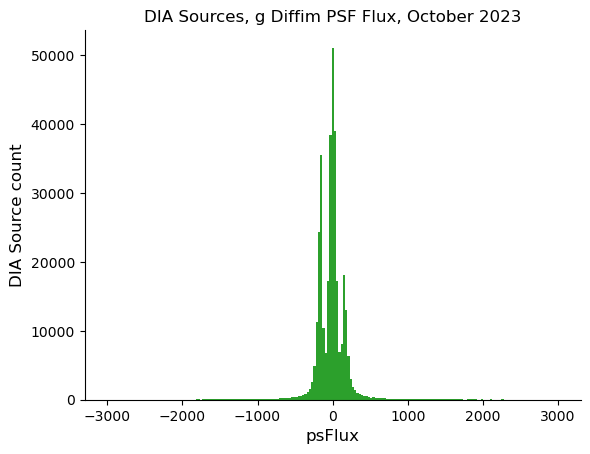

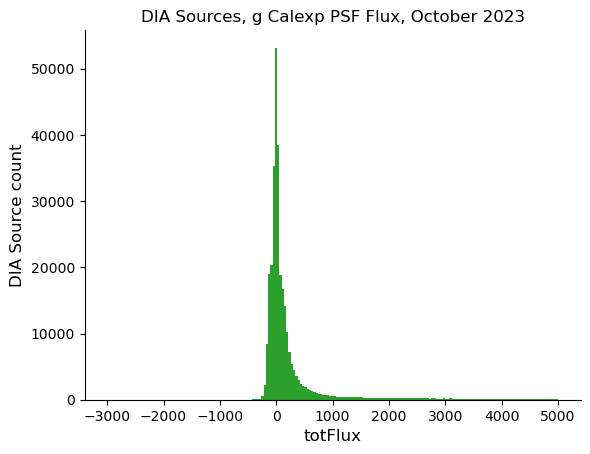

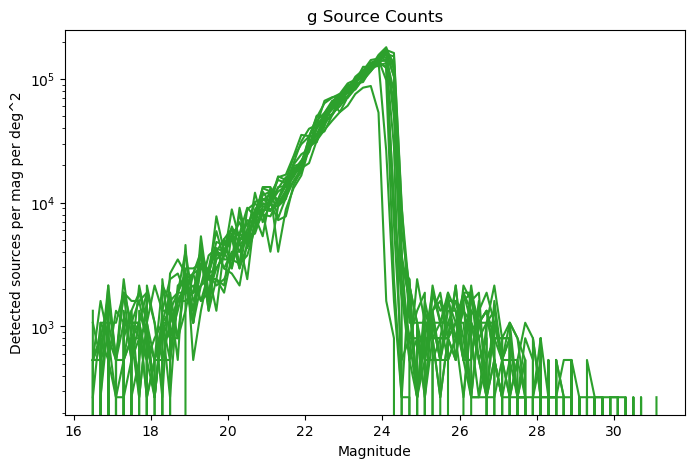

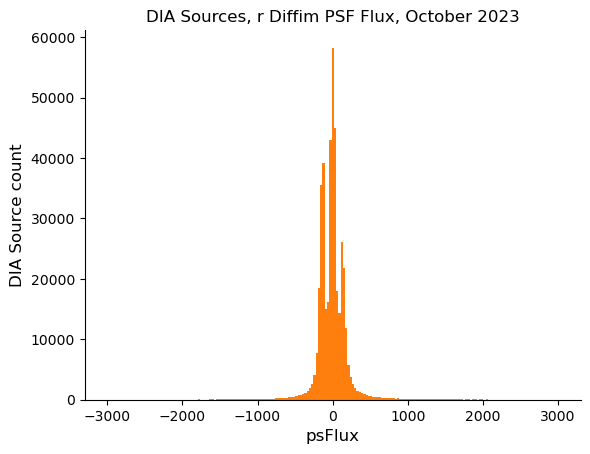

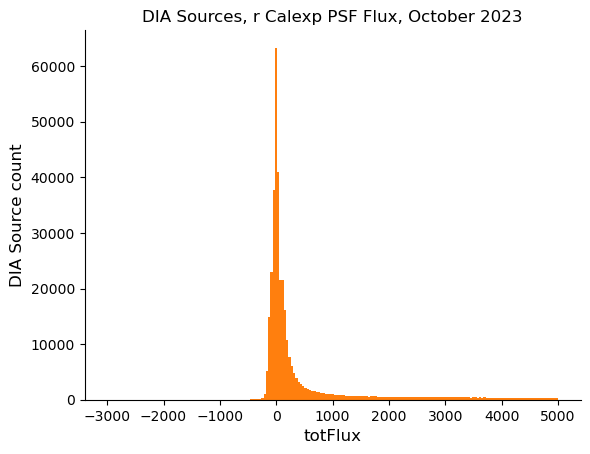

...

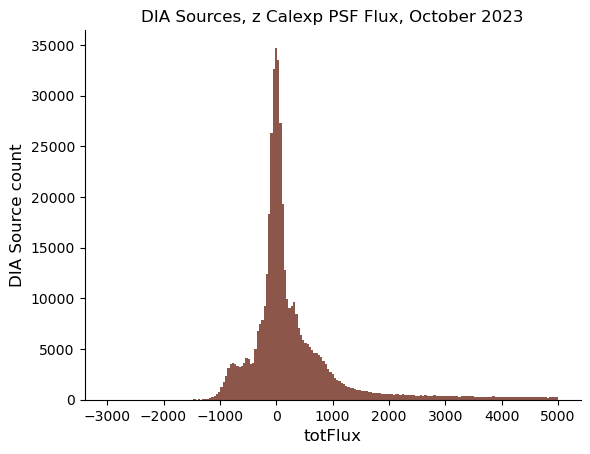

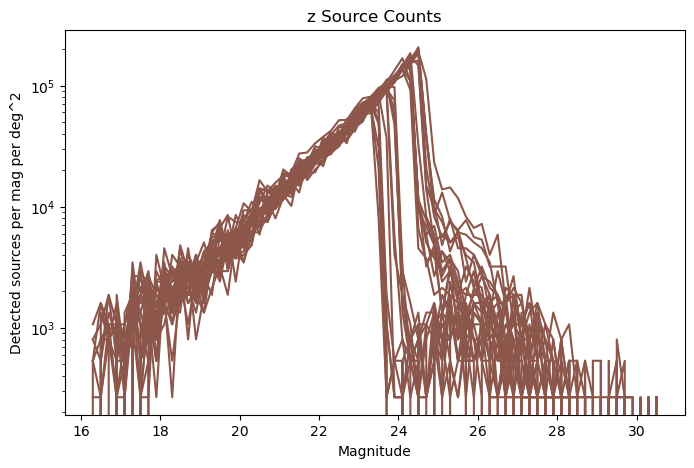

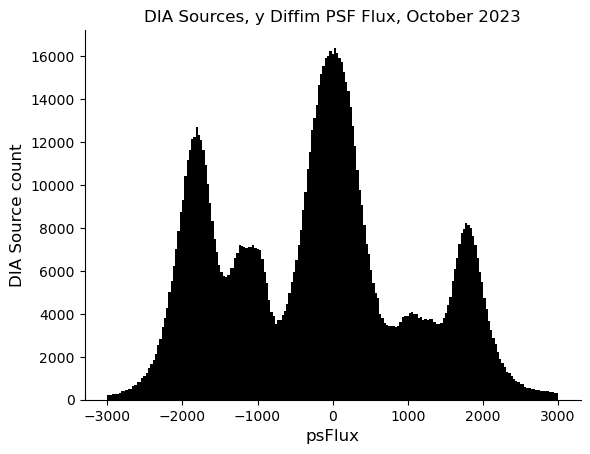

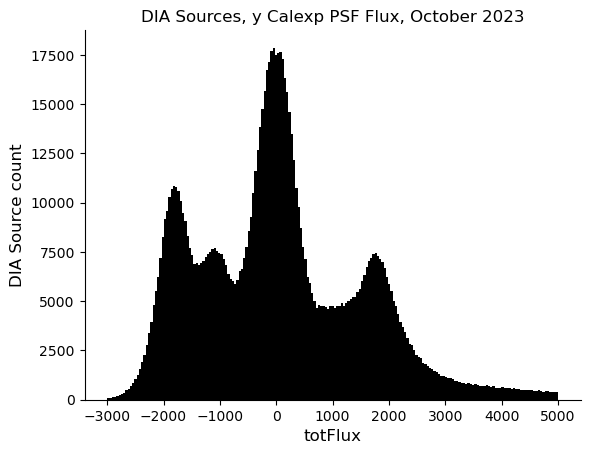

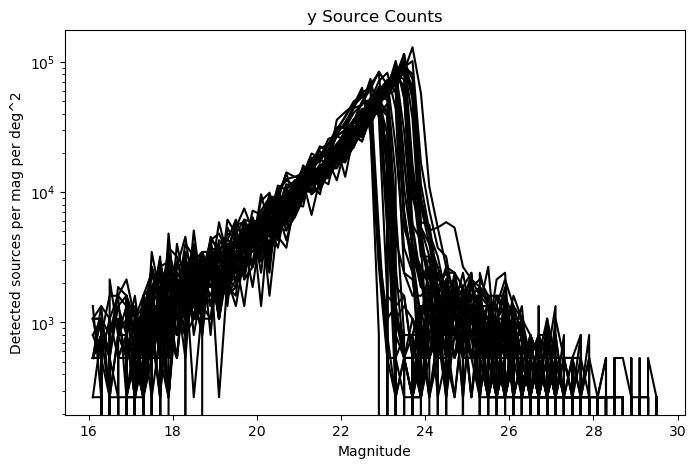

In [15]:
collection = collections

for band, color in zip(bandList, colorList):
    plac.plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == band], fluxType='psFlux',
                        title=f'DIA Sources, {band} Diffim PSF Flux, {month} {year}', color1=color, binmin=-3e3, binmax=3e3)
    plac.plotFluxHistSrc(goodSrc.loc[goodSrc['filterName'] == band], fluxType='totFlux',
                        title=f'DIA Sources, {band} Calexp PSF Flux, {month} {year}', color1=color, binmin=-3e3, binmax=5e3)
    plac.source_magnitude_histogram(repo, goodSrc, band, 'HSC', collection)

## 3. <a id="section_3">Comparison to previous processing run</a>

Plots are consistent, though with a sharp increase of dia sources which are explained by the increase in injected sources.

- The number of objects increased by 901098, and good objects increased by 1781984.
- The number of sources increased by 1392753, and good sources increased by 2480758.

Flags (although our plotting may need updated due to changes to some flags) show a major decrease almost across the board.

### Visual

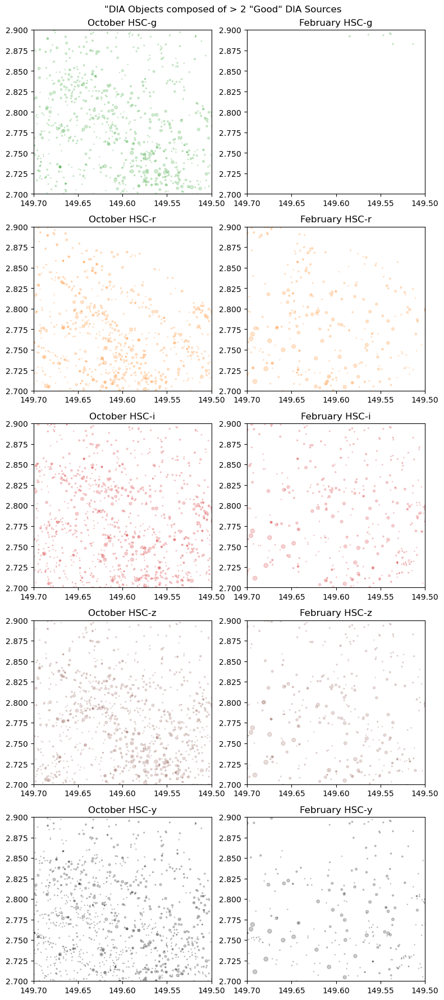

In [16]:
nSrc = 2
xlim = [149.7, 149.5]
ylim = [2.7, 2.9]
compare2 = compareByBand(goodObj, goodObj_old, nSrc = nSrc, alpha = 0.2, xlim = xlim, ylim = ylim,
                         title = f'"DIA Objects composed of > {nSrc} "Good" DIA Sources')

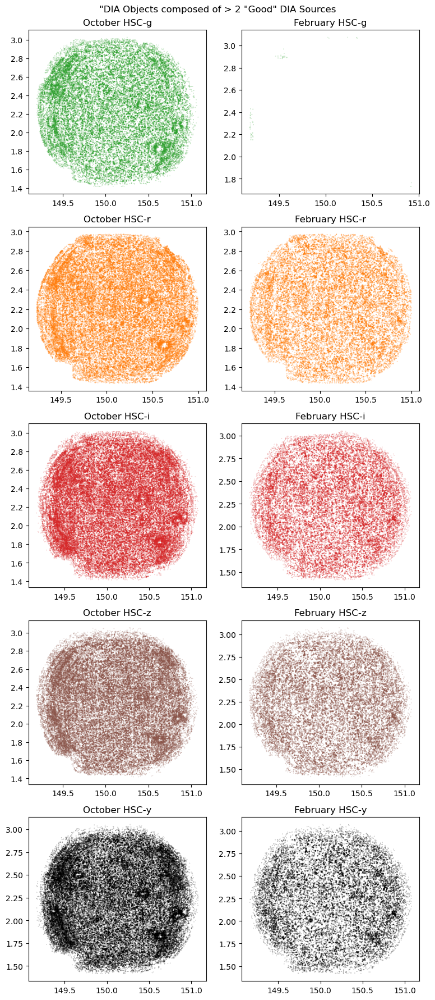

In [17]:
nSrc = 2
compare2 = compareByBand(goodObj, goodObj_old, nSrc = nSrc, alpha = 0.4, cutoff = 0,
                         title = f'"DIA Objects composed of > {nSrc} "Good" DIA Sources')

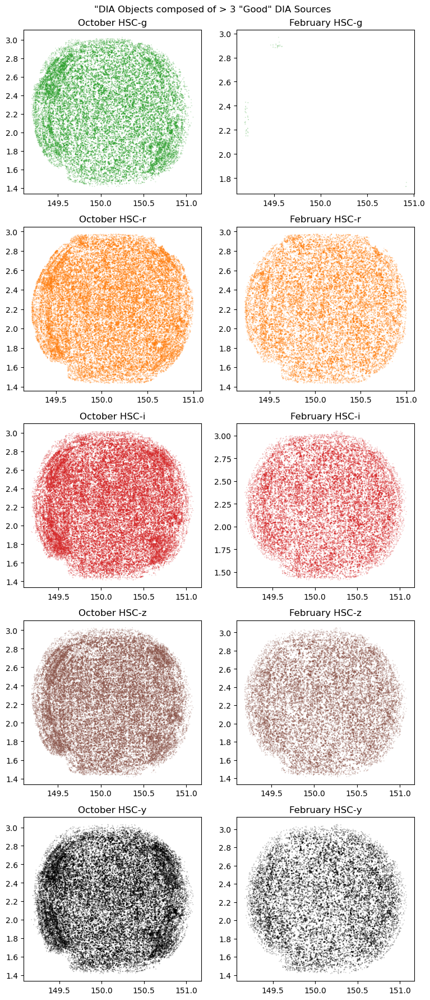

In [18]:
nSrc = 3
compare3 = compareByBand(goodObj, goodObj_old, nSrc = nSrc, alpha = 0.4, cutoff = 3,
                         title = f'"DIA Objects composed of > {nSrc} "Good" DIA Sources')

Text(0.5, 1.0, 'DIA Object and DIA Source counts (with fakes)')

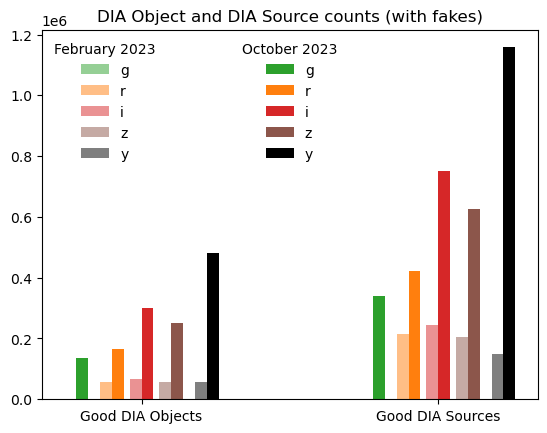

In [19]:
label1 = f'{month_old} {year_old}'
label2 = f'{month} {year}'

fig, ax = plt.subplots()
barLabels = ['Good DIA Objects', 'Good DIA Sources']
xbar = np.array([0, 1])
width = 0.2

# Previous Run
goodObjG_old = goodObj_old.loc[goodObj_old['gPSFluxMean'] > 0]
goodObjR_old = goodObj_old.loc[goodObj_old['rPSFluxMean'] > 0]
goodObjI_old = goodObj_old.loc[goodObj_old['iPSFluxMean'] > 0]
goodObjZ_old = goodObj_old.loc[goodObj_old['zPSFluxMean'] > 0]
goodObjY_old = goodObj_old.loc[goodObj_old['yPSFluxMean'] > 0]

goodSrcG_old = goodSrc_old.loc[goodSrc_old['filterName'] == 'g']
goodSrcR_old = goodSrc_old.loc[goodSrc_old['filterName'] == 'r']
goodSrcI_old = goodSrc_old.loc[goodSrc_old['filterName'] == 'i']
goodSrcZ_old = goodSrc_old.loc[goodSrc_old['filterName'] == 'z']
goodSrcY_old = goodSrc_old.loc[goodSrc_old['filterName'] == 'y']

g_old = ax.bar(xbar - (6/5) * width, [len(goodObjG_old), len(goodSrcG_old)], width/5, label='g', color='C2', alpha=0.5)
r_old = ax.bar(xbar - (3/5) * width, [len(goodObjR_old), len(goodSrcR_old)], width/5, label='r', color='C1', alpha=0.5)
i_old = ax.bar(xbar - (1/10) * width, [len(goodObjI_old), len(goodSrcI_old)], width/5, label='i', color='C3', alpha=0.5)
z_old = ax.bar(xbar + (2/5) * width, [len(goodObjZ_old), len(goodSrcZ_old)], width/5, label='z', color='C5', alpha=0.5)
y_old = ax.bar(xbar + width, [len(goodObjY_old), len(goodSrcY_old)], width/5, label='y', color='k', alpha=0.5)

# Current 
goodObjG = goodObj.loc[goodObj['gPSFluxMean'] > 0]
goodObjR = goodObj.loc[goodObj['rPSFluxMean'] > 0]
goodObjI = goodObj.loc[goodObj['iPSFluxMean'] > 0]
goodObjZ = goodObj.loc[goodObj['zPSFluxMean'] > 0]
goodObjY = goodObj.loc[goodObj['yPSFluxMean'] > 0]

goodSrcG = goodSrc.loc[goodSrc['filterName'] == 'g']
goodSrcR = goodSrc.loc[goodSrc['filterName'] == 'r']
goodSrcI = goodSrc.loc[goodSrc['filterName'] == 'i']
goodSrcZ = goodSrc.loc[goodSrc['filterName'] == 'z']
goodSrcY = goodSrc.loc[goodSrc['filterName'] == 'y']

g = ax.bar(xbar - width, [len(goodObjG), len(goodSrcG)], width/5, label='g', color='C2')
r = ax.bar(xbar - (2/5) * width, [len(goodObjR), len(goodSrcR)], width/5, label='r', color='C1')
i = ax.bar(xbar + (1/10) * width, [len(goodObjI), len(goodSrcI)], width/5, label='i', color='C3')
z = ax.bar(xbar + (3/5) * width, [len(goodObjZ), len(goodSrcZ)], width/5, label='z', color='C5')
y = ax.bar(xbar + (6/5) * width, [len(goodObjY), len(goodSrcY)], width/5, label='y', color='k')

ax.set_xticks([0, 1])
labels = ax.set_xticklabels(barLabels)
previous_legend = plt.legend(handles=[g_old, r_old, i_old, z_old,  y_old], loc='upper left', frameon=False, title=label1)
ax = plt.gca().add_artist(previous_legend)
current_legend = plt.legend(handles=[g, r, i, z,  y], loc='upper center', frameon=False, title=label2)
plt.title(f'DIA Object and DIA Source counts ({fakeStatus})')

Text(0.5, 1.0, 'Comparing DIA Object and Source counts (with fakes)')

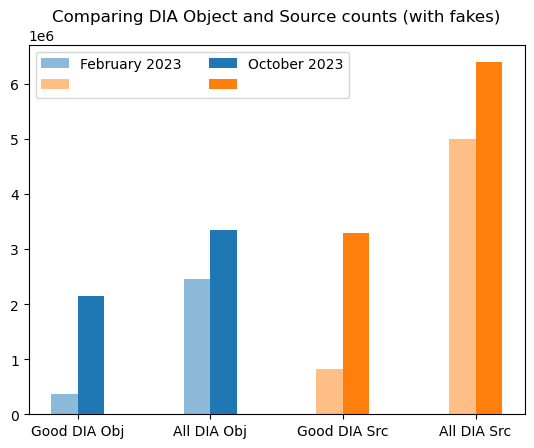

In [20]:
label1 = f'{month_old} {year_old}'
label2 = f'{month} {year}'

fig, ax = plt.subplots()
barLabels = ['Good DIA Obj', 'All DIA Obj', 'Good DIA Src', 'All DIA Src']
xbar = np.array([0, 1])
width = 0.2

# Previous Run
ax.bar(xbar - width/2, [len(goodObj_old), len(objTable_old)], 
       width, label=label1, color='C0', alpha=0.5)
ax.bar(xbar + 2 - width/2, [len(goodSrc_old), len(srcTable_old)],
       width, label=' ', color='C1', alpha=0.5)

# Current Run
ax.bar(xbar + width/2, [len(goodObj), len(objTable)], 
       width, label=label2, color='C0')
ax.bar(xbar + 2 + width/2, [len(goodSrc), len(srcTable)],
       width, label=' ', color='C1')

plt.legend(ncol=2)
ax.set_xticks([0, 1, 2, 3])
labels = ax.set_xticklabels(barLabels)
plt.title(f'Comparing DIA Object and Source counts ({fakeStatus})')

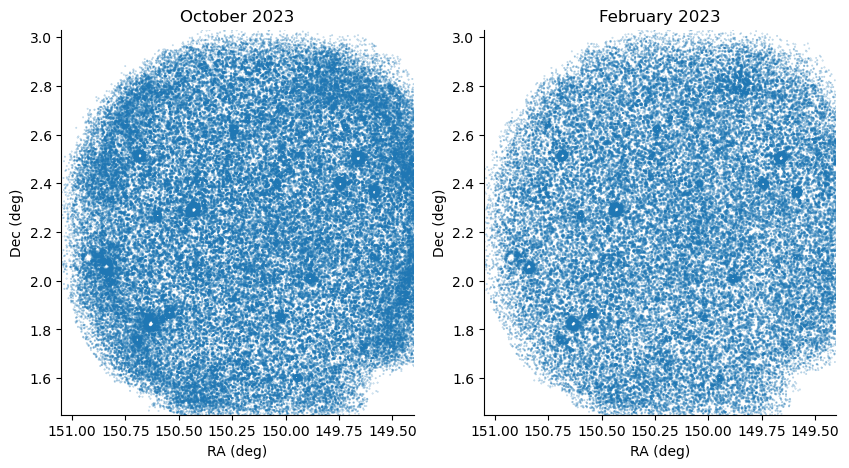

In [21]:
cutoff = 3
compareAll(goodObj, goodObj_old, cutoff = cutoff,
           title = f'DIA Objects composed of > {cutoff} "Good" DIA Sources ({fakeStatus})')

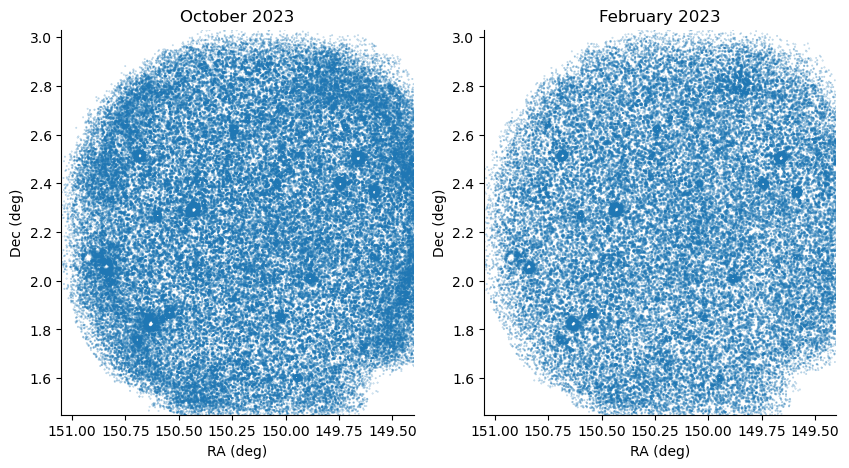

In [22]:
cutoff = 3
compareAll(goodObj, goodObj_old, cutoff = cutoff,
           title = f'DIA Objects composed of > {cutoff} "Good" DIA Sources ({fakeStatus})')

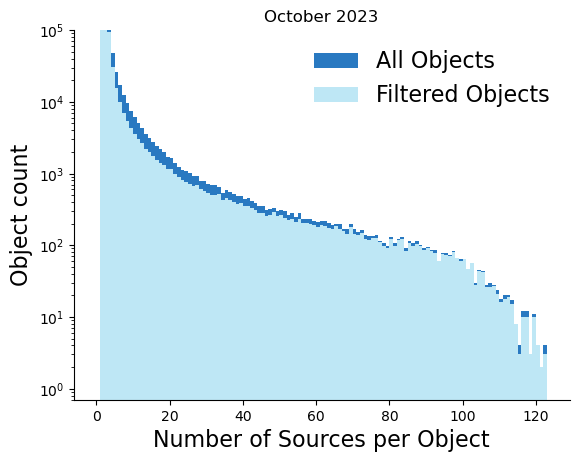

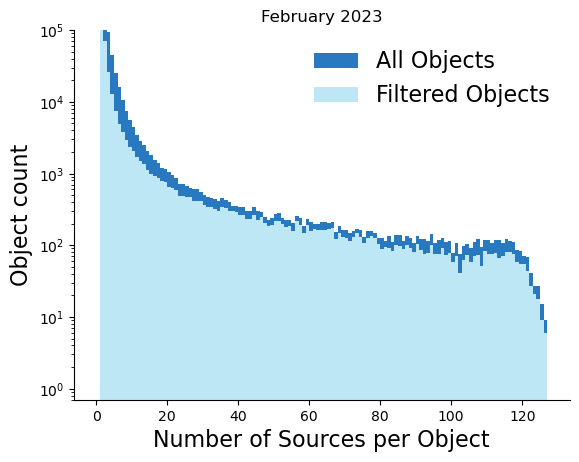

In [23]:
plac.plotDiaObjectHistogram(objTable, goodObj, title=f'{month} {year}');
plac.plotDiaObjectHistogram(objTable_old, goodObj_old, title=f'{month_old} {year_old}');

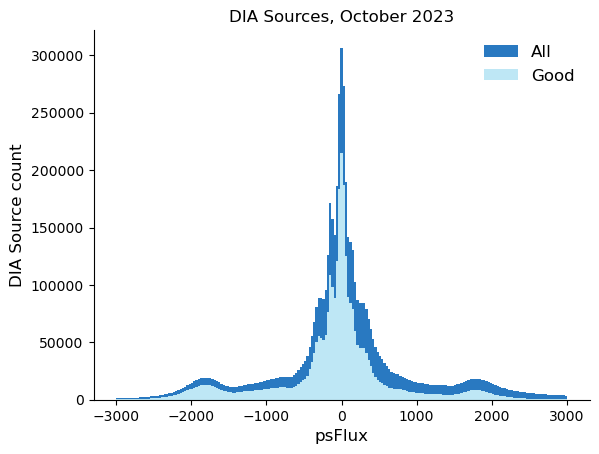

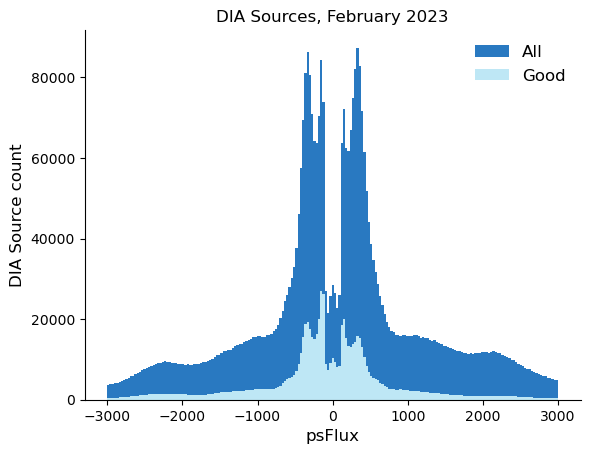

In [24]:
plac.plotFluxHistSrc(srcTable, goodSrc, fluxType='psFlux', label1='All', label2='Good',
                title=f'DIA Sources, {month} {year}')
plac.plotFluxHistSrc(srcTable_old, goodSrc_old, fluxType='psFlux', label1='All', label2='Good',
                title=f'DIA Sources, {month_old} {year_old}')

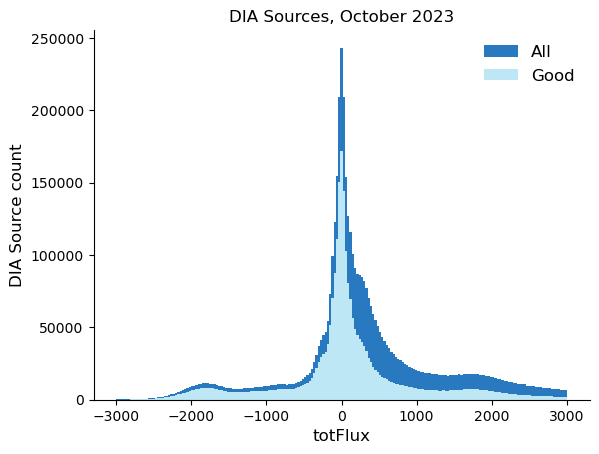

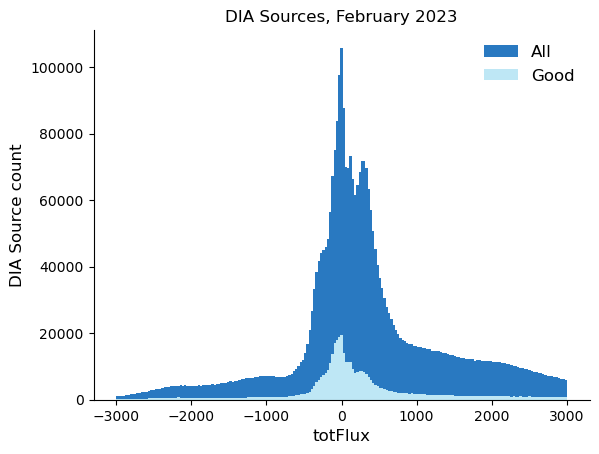

In [25]:
plac.plotFluxHistSrc(srcTable, goodSrc, fluxType='totFlux', label1='All', label2='Good',
                title=f'DIA Sources, {month} {year}')
plac.plotFluxHistSrc(srcTable_old, goodSrc_old, fluxType='totFlux', label1='All', label2='Good',
                title=f'DIA Sources, {month_old} {year_old}')

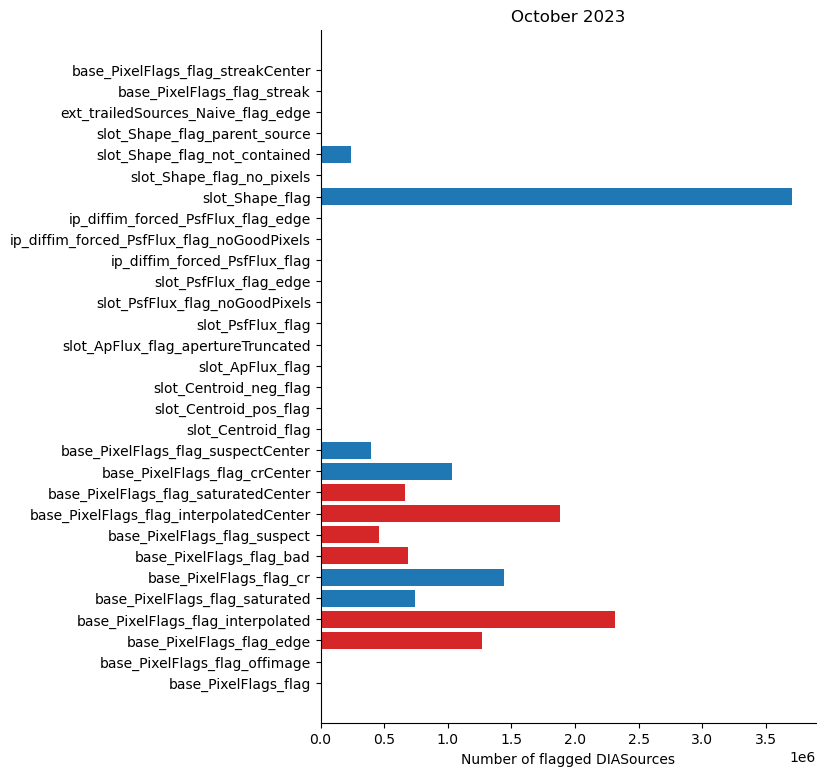

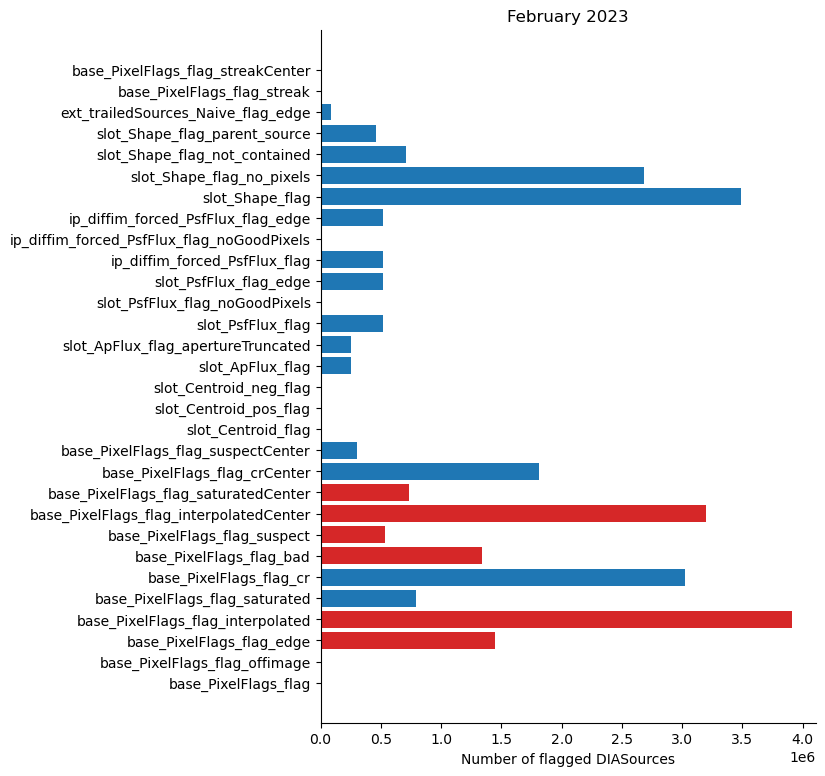

In [26]:
plac.plotFlagHist(srcTable, title=f'{month} {year}', badFlagList=badFlagList)
plac.plotFlagHist(srcTable_old, title=f'{month_old} {year_old}', badFlagList=badFlagList)

### By the numbers

In [27]:
nGoodObj = len(goodObj)
nGoodObj_old = len(goodObj_old)

print(f"{month} {year}, Number of good objects: ",nGoodObj)
print(f"{month_old} {year_old}, Number of good objects: ",nGoodObj_old)

print("Diff: ", nGoodObj-nGoodObj_old)

October 2023, Number of good objects:  2145507
February 2023, Number of good objects:  363523
Diff:  1781984


In [28]:
nObj = len(objTable)
nObj_old = len(objTable_old)

print(f"{month} {year}, Number of objects: ",nObj)
print(f"{month_old} {year_old}, Number of objects: ",nObj_old)

print("Diff: ", nObj-nObj_old)

October 2023, Number of objects:  3352118
February 2023, Number of objects:  2451020
Diff:  901098


In [29]:
nGoodSrc = len(goodSrc)
nGoodSrc_old = len(goodSrc_old)

print(f"{month} {year}, Number of good sources: ",nGoodSrc)
print(f"{month_old} {year_old}, Number of good sources: ",nGoodSrc_old)

print("Diff: ", nGoodSrc-nGoodSrc_old)

October 2023, Number of good sources:  3295613
February 2023, Number of good sources:  814855
Diff:  2480758


In [30]:
nSrc = len(srcTable)
nSrc_old = len(srcTable_old)

print(f"{month} {year}, Number of sources: ",nSrc)
print(f"{month_old} {year_old}, Number of sources: ",nSrc_old)

print("Diff: ", nSrc-nSrc_old)

October 2023, Number of sources:  6395278
February 2023, Number of sources:  5002525
Diff:  1392753


In [31]:
flagSum = flagTable.sum()
flagSum_old = flagTable_old.sum()

print(f"Difference between {month} {year} run and {month_old} {year_old} run, ordered:")
flagSum.subtract(flagSum_old).sort_values()

Difference between October 2023 run and February 2023 run, ordered:


slot_Shape_flag_no_pixels                    -2683043
base_PixelFlags_flag_interpolated            -1599967
base_PixelFlags_flag_cr                      -1583691
base_PixelFlags_flag_interpolatedCenter      -1312904
base_PixelFlags_flag_crCenter                 -775315
base_PixelFlags_flag_bad                      -652861
slot_PsfFlux_flag                             -507555
ip_diffim_forced_PsfFlux_flag                 -506981
ip_diffim_forced_PsfFlux_flag_edge            -506903
slot_PsfFlux_flag_edge                        -506903
slot_Shape_flag_not_contained                 -471021
slot_Shape_flag_parent_source                 -457341
slot_ApFlux_flag_apertureTruncated            -250392
slot_ApFlux_flag                              -247445
base_PixelFlags_flag_edge                     -177955
ext_trailedSources_Naive_flag_edge             -90264
base_PixelFlags_flag_suspect                   -80970
base_PixelFlags_flag_saturatedCenter           -74318
base_PixelFlags_flag_saturat

## 4. <a id="section_4">Separating the fake sources from the real sources</a>

Something went wrong with fakes matching. We caught barely any of the fakes that were injected, though there were more injected than normal.

In [32]:
tractList = [9813]

In [33]:
allInjectedFakes = butler.get('fakes_fakeSourceCat', collections=collections,
                 instrument=instrument, skymap=skymap, tract=9813, storageClass='ArrowAstropy')
allInjectedFakes['ra'] = (allInjectedFakes['ra']*u.radian).to(u.deg)
allInjectedFakes['dec']= (allInjectedFakes['dec']*u.radian).to(u.deg)

In [34]:
diaSource = butler.get('fakes_goodSeeingDiff_diaSrcTable', collections=collections,
                 instrument=instrument, detector=62, visit=352, skymap=skymap, tract=9813, storageClass='ArrowAstropy')

In [35]:
from astropy.table import Table
from lsst.analysis.tools.tasks.catalogMatch import CatalogMatchTask

t1 = Table()
t1["ra_steven"] = [1,2]
t1["dec_manuel"] = [1,2]

t2 = Table()
t2["ra"] = [1,2]
t2["dec"] = [1,2]

CMT = CatalogMatchTask()
CMT.config.selectorBands = []
CMT.config.targetRaColumn = "ra"
CMT.config.targetDecColumn = "dec"
CMT.config.refRaColumn = "ra"
CMT.config.refDecColumn = "dec"                                      

matchedCat = CMT.run(targetCatalog=allInjectedFakes, refCatalog=diaSource, bands=[])
print(matchedCat)

Struct(matchedCatalog=   fakeId_target         dec_target     ...   matchDistance   
                            deg         ...                   
-------------------- ------------------ ... ------------------
12633253782695864572 2.4078610751899943 ... 0.6771659805547349)


Well that's not good.

## 5. <a id="section_5">Fakes completeness analysis</a>

Skipping due to the issue with matched fakes.

## 6. <a id="section_6">Calexp and PSF analysis</a>

Plots are consistent with previous run. Accepted and rejected PSF sources are evenly distributed.

In [36]:
visits = [29350]
detectors = [49]

Collection:  u/elhoward/DM-37699/HSC-precon-rb , Visit:  29350 , Detector:  49


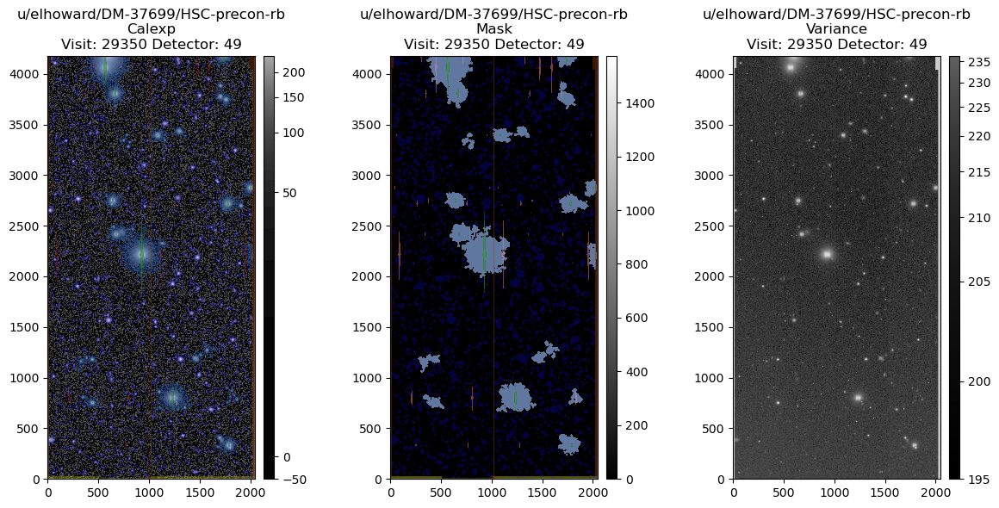

Collection:  u/elhoward/DM-37695/HSC-fakes , Visit:  29350 , Detector:  49


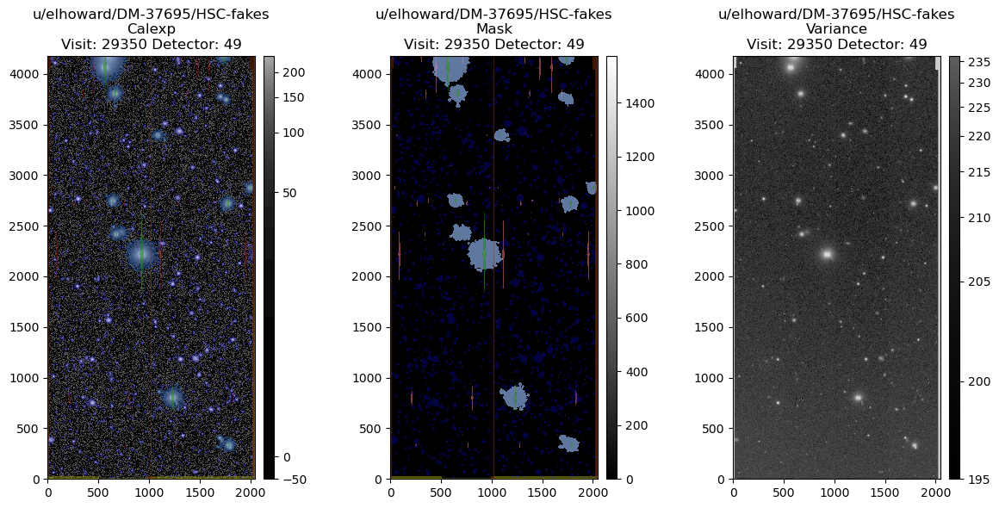

In [37]:
for collection in collectionsList:
    for visit in visits:
        for detector in detectors:
            print('Collection: ', collection,
                  ', Visit: ', visit,
                  ', Detector: ', detector)
            afwDisplay.setDefaultBackend('matplotlib') 

            calexp = butler.get('calexp', instrument='HSC',
                                visit=visit, detector=detector, collections=collection)
            fig, (ax1,ax2,ax3) = plt.subplots(1, 3, figsize=(12, 6))

            plt.sca(ax1)  # set the first axis as current
            display1 = afwDisplay.Display(frame=fig)
            display1.scale('asinh', -1, 30)
            display1.mtv(calexp, f'{collection}\nCalexp\nVisit: {visit} Detector: {detector}')

            plt.sca(ax2)  # set the second axis as current
            display2 = afwDisplay.Display(frame=fig)
            display2.mtv(calexp.mask, f'{collection}\nMask\nVisit: {visit} Detector: {detector}')

            plt.sca(ax3) # set the third axis as current
            display3 = afwDisplay.Display(frame=fig)
            display3.scale('asinh', 'zscale')
            display3.mtv(calexp.variance, f'{collection}\nVariance\nVisit: {visit} Detector: {detector}')

            plt.tight_layout()
            plt.show()
            plt.close(fig)

Visit:  29350 , Detector:  49


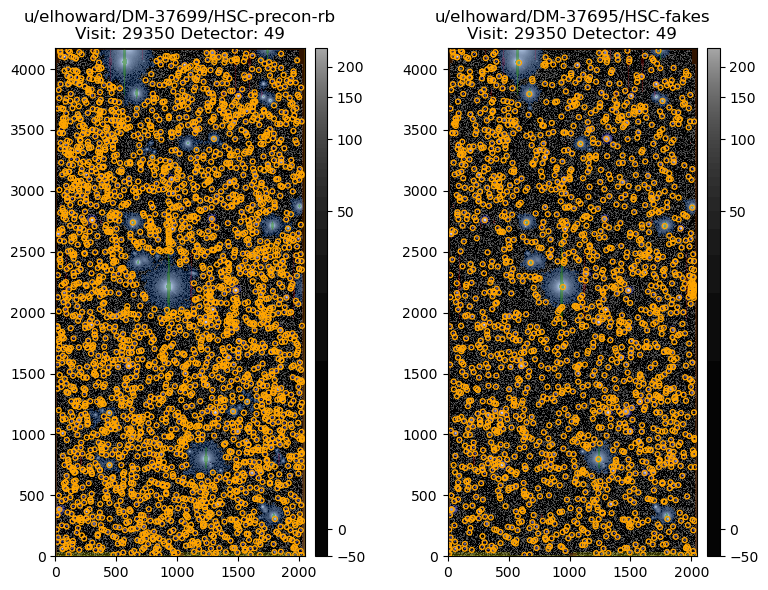

In [38]:
for visit in visits:
    for detector in detectors:
        print('Visit: ', visit, ', Detector: ', detector)
        afwDisplay.setDefaultBackend('matplotlib') 

        fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(8, 6))

        plt.sca(ax1)  # set the first axis as current
        calexp1 = butler.get('calexp', instrument=instrument,
                        visit=visit, detector=detector, collections=collections)
        display1 = afwDisplay.Display(frame=fig)
        display1.setMaskTransparency(80)
        display1.scale('asinh', -1, 30)
        display1.mtv(calexp1, f'{collections}\nVisit: {visit} Detector: {detector}')
        src1 = butler.get('src', instrument=instrument,
                          visit=visit, detector=detector, collections=collections)
        with display1.Buffering():
            for record in src1:
                display1.dot('o', record.getX(), record.getY(), size=20, ctype='orange')

        plt.sca(ax2)  # set the second axis as current
        calexp2 = butler.get('calexp', instrument=instrument,
                        visit=visit, detector=detector, collections=collections_old)
        display2 = afwDisplay.Display(frame=fig)
        display2.setMaskTransparency(80)
        display2.scale('asinh', -1, 30)
        display2.mtv(calexp2, f'{collections_old}\nVisit: {visit} Detector: {detector}')
        src2 = butler.get('src', instrument=instrument,
                          visit=visit, detector=detector, collections=collections_old)
        with display2.Buffering():
            for record in src2:
                display2.dot('o', record.getX(), record.getY(), size=20, ctype='orange')
        plt.tight_layout()
        plt.show()
        plt.close(fig)

Collection:  u/elhoward/DM-37699/HSC-precon-rb , Visit:  29350 , Detector:  49
Accepted PSF Sources (green):  47  Rejected PSF Sources (red):  19


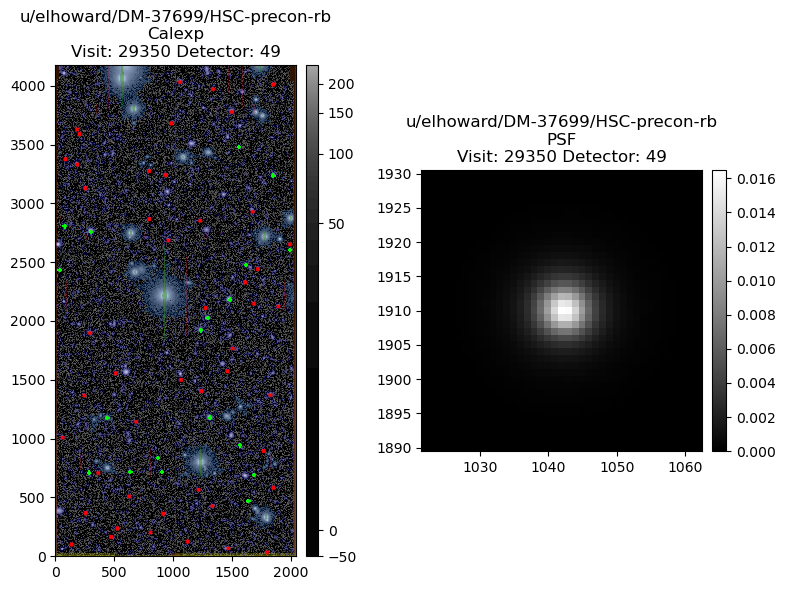

Collection:  u/elhoward/DM-37695/HSC-fakes , Visit:  29350 , Detector:  49
Accepted PSF Sources (green):  40  Rejected PSF Sources (red):  20


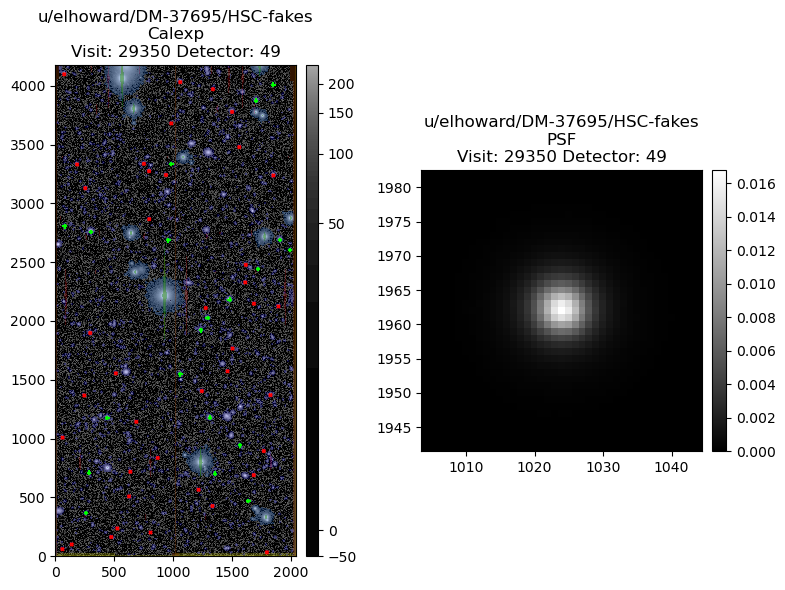

In [39]:
for collection in collectionsList:
    for visit in visits:
        for detector in detectors:
            print('Collection: ', collection,
                  ', Visit: ', calexp.visitInfo.getId(),
                  ', Detector: ', calexp.detector.getId())
            
            afwDisplay.setDefaultBackend('matplotlib') 
            fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(8, 6))
            
            plt.sca(ax1)  # set the first axis as current
            calexp = butler.get('calexp', instrument=instrument,
                                visit=visit, detector=detector, collections=collection)
            display1 = afwDisplay.Display(frame=fig)
            display1.setMaskTransparency(80)
            display1.scale('asinh', -1, 30)
            display1.mtv(calexp, f'{collection}\nCalexp\nVisit: {visit} Detector: {detector}')
            src = butler.get('src', instrument=instrument,
                             visit=visit, detector=detector, collections=collection)
            acceptedPsfSources = src[src['calib_psf_used']]
            rejectedPsfSources = src[src['calib_psf_candidate'] &
                                 (src['calib_psf_used'] == False)]
            print('Accepted PSF Sources (green): ', len(acceptedPsfSources),
                  ' Rejected PSF Sources (red): ', len(rejectedPsfSources))
            with display1.Buffering():
                for s in src[src['calib_psf_used']]:
                    display1.dot("x", s.getX(), s.getY(), size=10, ctype='red')
            with display1.Buffering():
                for s in rejectedPsfSources:
                    display1.dot("+", s.getX(), s.getY(), size=10, ctype='green')

            plt.sca(ax2)  # set the second axis as current
            psf = calexp.getPsf()
            position = psf.getAveragePosition()
            display2 = afwDisplay.Display(frame=fig)
            display2.mtv(psf.computeImage(position), f'{collection}\nPSF\nVisit: {visit} Detector: {detector}')
            
            plt.tight_layout()
            plt.show()
            plt.close(fig)

## 7. <a id="section_7">SNR distributions</a>

Aside from the addition of `g` band, SNR distribution is consistent with previous run. Still have some outliers.

(0.0, 10000.0)

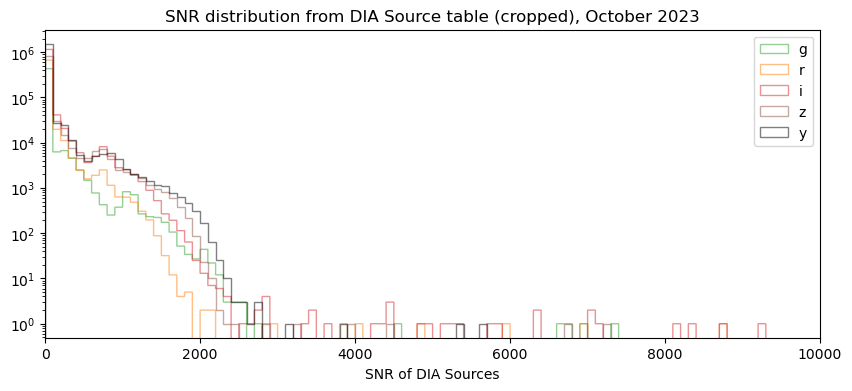

In [40]:
binwidth=100

plt.figure(figsize=(10,4))
plt.yscale('log')
for band, color in zip(bandList, colorList):
    data = srcTable.loc[srcTable.filterName==band, 'snr']
    snrHist = plt.hist(data, bins=range(0, int(max(data)) + binwidth, binwidth), color=color, alpha=0.5, label=band, histtype='step')
plt.legend()
plt.title(f'SNR distribution from DIA Source table (cropped), {month} {year}')
plt.xlabel('SNR of DIA Sources')
plt.gca().set_xlim(0, 10000)

Text(0.5, 0, 'SNR of DIA Sources')

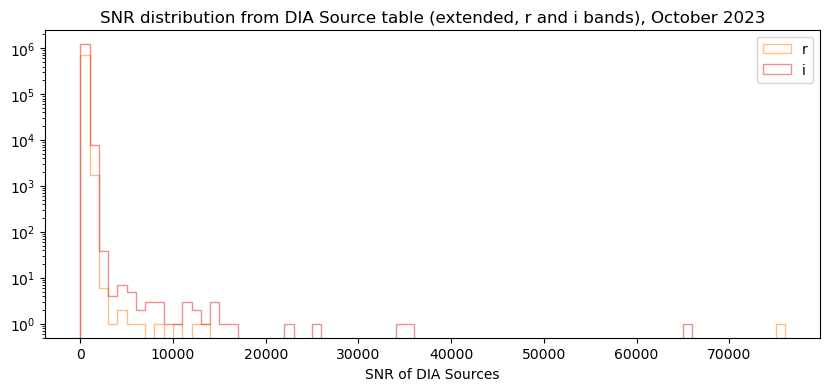

In [41]:
binwidth = 1000

plt.figure(figsize=(10,4))
plt.yscale('log')
for band, color in zip(bandList[1:3], colorList[1:3]):
    data = srcTable.loc[srcTable.filterName==band, 'snr']
    snrHist = plt.hist(data, bins=range(0, int(max(data)) + binwidth, binwidth), color=color, alpha=0.5, label=band, histtype='step')
plt.legend()
plt.title(f'SNR distribution from DIA Source table (extended, r and i bands), {month} {year}')
plt.xlabel('SNR of DIA Sources')

In [42]:
# Pre-snr column:
srcTable['psFluxSNR'] = srcTable.psFlux / srcTable.psFluxErr
srcTable['totFluxSNR'] = srcTable.totFlux / srcTable.totFluxErr

Text(0.5, 0, 'psFlux/psFluxErr')

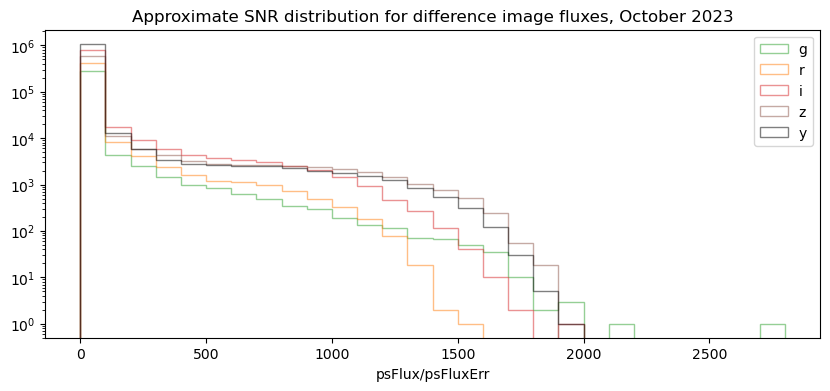

In [43]:
binwidth=100

plt.figure(figsize=(10,4))
plt.yscale('log')
for band, color in zip(bandList, colorList):
    data = srcTable.loc[srcTable.filterName==band, 'psFluxSNR']
    psFluxHist = plt.hist(data, bins=range(0, int(max(data)) + binwidth, binwidth), color=color, alpha=0.5, label=band, histtype='step')
plt.legend()
plt.title(f'Approximate SNR distribution for difference image fluxes, {month} {year}')
plt.xlabel('psFlux/psFluxErr')

Text(0.5, 0, 'totFlux/totFluxErr')

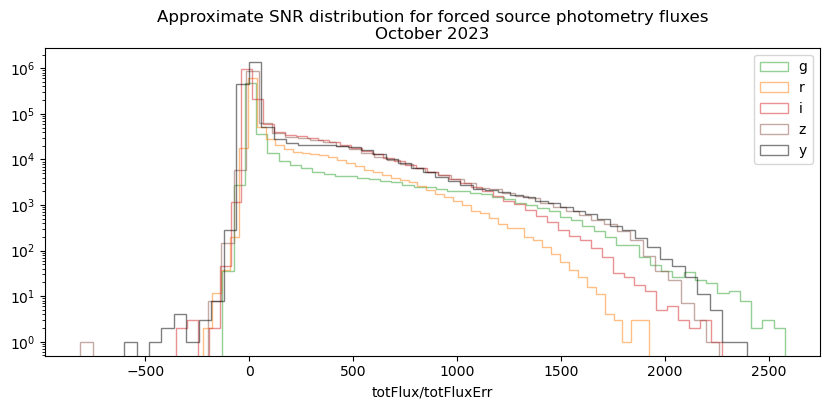

In [44]:
plt.figure(figsize=(10,4))
plt.yscale('log')
for band, color in zip(bandList, colorList):
    totFluxHist = plt.hist(srcTable.loc[srcTable.filterName==band, 'totFluxSNR'], bins=50, color=color, alpha=0.5, label=band, histtype='step')
plt.legend()
plt.title(f'Approximate SNR distribution for forced source photometry fluxes\n{month} {year}')
plt.xlabel('totFlux/totFluxErr')